In [ ]:
import numpy as np
import torch
import time
import copy
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset,random_split

In [ ]:
# from google.colab import drive
# drive.mount('/content/gdrive')
# data_path = "/content/drive/MyDrive/COMP551_HW3/"
data_path = "/home/elvinzhang0_gmail_com/AMLP3/"
device = 'cuda' if torch.cuda.is_available() else 'cpu'

#Load Data

In [ ]:
class EmbDataset(Dataset):
    def __init__(self):
        self.imgs = torch.Tensor(np.clip(np.load(data_path+"images_l.pkl", allow_pickle=True),0,255)/255.0).unsqueeze(1).to(device)
        self.labels = torch.Tensor(np.load(data_path+"labels_l.pkl", allow_pickle=True)).to(device)

    def __len__(self):
        return len(self.imgs)
        
    def __getitem__(self, idx):
        return self.imgs[idx], self.labels[idx]
    

In [ ]:
dataset = EmbDataset()
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

testdata = torch.Tensor(np.clip(np.load(data_path+"images_test.pkl", allow_pickle=True),0,255)/255.0).unsqueeze(1)
test_loader = DataLoader(testdata, batch_size=32, shuffle=False)

#ResNet

###Model

In [ ]:
class Block(nn.Module):
    def __init__(self, num_layers, in_channels, out_channels, identity_downsample=None, stride=1):
        assert num_layers in [18, 34, 50, 101, 152], "should be a a valid architecture"
        super(Block, self).__init__()
        self.num_layers = num_layers
        if self.num_layers > 34:
            self.expansion = 4
        else:
            self.expansion = 1
        # ResNet50, 101, and 152 include additional layer of 1x1 kernels
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0)
        self.bn1 = nn.BatchNorm2d(out_channels)
        if self.num_layers > 34:
            self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        else:
            # for ResNet18 and 34, connect input directly to (3x3) kernel (skip first (1x1))
            self.conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.conv3 = nn.Conv2d(out_channels, out_channels * self.expansion, kernel_size=1, stride=1, padding=0)
        self.bn3 = nn.BatchNorm2d(out_channels * self.expansion)
        self.relu = nn.ReLU()
        self.identity_downsample = identity_downsample

    def forward(self, x):
        identity = x
        if self.num_layers > 34:
            x = self.conv1(x)
            x = self.bn1(x)
            x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.bn3(x)

        if self.identity_downsample is not None:
            identity = self.identity_downsample(identity)

        x += identity
        x = self.relu(x)
        return x

In [ ]:
class ResNet(nn.Module):
    def __init__(self, num_layers, block, image_channels, num_classes):
        assert num_layers in [18, 34, 50, 101, 152], f'ResNet{num_layers}: Unknown architecture! Number of layers has ' \
                                                     f'to be 18, 34, 50, 101, or 152 '
        super(ResNet, self).__init__()
        if num_layers < 50:
            self.expansion = 1
        else:
            self.expansion = 4
        if num_layers == 18:
            layers = [2, 2, 2, 2]
        elif num_layers == 34 or num_layers == 50:
            layers = [3, 4, 6, 3]
        elif num_layers == 101:
            layers = [3, 4, 23, 3]
        else:
            layers = [3, 8, 36, 3]
        self.in_channels = 64
        self.conv1 = nn.Conv2d(image_channels, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # ResNetLayers
        self.layer1 = self.make_layers(num_layers, block, layers[0], intermediate_channels=64, stride=1)
        self.layer2 = self.make_layers(num_layers, block, layers[1], intermediate_channels=128, stride=2)
        self.layer3 = self.make_layers(num_layers, block, layers[2], intermediate_channels=256, stride=2)
        self.layer4 = self.make_layers(num_layers, block, layers[3], intermediate_channels=512, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * self.expansion, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fc(x)
        return x

    def make_layers(self, num_layers, block, num_residual_blocks, intermediate_channels, stride):
        layers = []

        identity_downsample = nn.Sequential(nn.Conv2d(self.in_channels, intermediate_channels*self.expansion, kernel_size=1, stride=stride),
                                            nn.BatchNorm2d(intermediate_channels*self.expansion))
        layers.append(block(num_layers, self.in_channels, intermediate_channels, identity_downsample, stride))
        self.in_channels = intermediate_channels * self.expansion # 256
        for i in range(num_residual_blocks - 1):
            layers.append(block(num_layers, self.in_channels, intermediate_channels)) # 256 -> 64, 64*4 (256) again
        return nn.Sequential(*layers)

In [ ]:
def ResNet18(img_channels=1, num_classes=36):
    return ResNet(18, Block, img_channels, num_classes)


def ResNet34(img_channels=1, num_classes=36):
    return ResNet(34, Block, img_channels, num_classes)


def ResNet50(img_channels=1, num_classes=36):
    return ResNet(50, Block, img_channels, num_classes)


def ResNet101(img_channels=1, num_classes=36):
    return ResNet(101, Block, img_channels, num_classes)


def ResNet152(img_channels=1, num_classes=36):
    return ResNet(152, Block, img_channels, num_classes)


###Training

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=300, is_inception=False):
    
    since = time.time()
    train_acc_history = []
    val_acc_history = []
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        for phase in ['train', 'val']: # Each epoch has a training and validation phase
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]: # Iterate over data
                
                inputs = transforms.functional.resize(inputs, (112, 112))
                inputs = inputs.to(device)

                labels = labels.to(device)

                optimizer.zero_grad() # Zero the parameter gradients

                with torch.set_grad_enabled(phase == 'train'): # Forward. Track history if only in train
                    
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    
                    _n, numbers = torch.max(outputs[:, :10], 1)
                    _l, letters = torch.max(outputs[:, 10:], 1)
                    preds = numbers * 100 + letters;
                    if phase == 'train': # Backward + optimize only if in training phase
                        loss.backward()
                        optimizer.step()
                    # print('Loss', loss)

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                _n, numbers = torch.max(labels.data[:, :10], 1)
                _l, letters = torch.max(labels.data[:, 10:], 1)
                tl = numbers * 100 + letters;
                running_corrects += torch.sum(preds == tl)
                
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            
            if phase == 'val': # Adjust learning rate based on val loss
                lr_scheduler.step(epoch_loss)
                
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)
            else:
                train_acc_history.append(epoch_acc)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, train_acc_history, val_acc_history

In [ ]:
model = ResNet34(1, 36).to(device)
epochs = 35
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, verbose=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
model, train_acc_history, val_acc_history = train_model(model, {"train": train_loader, "val": val_loader}, criterion, optimizer, epochs)


Epoch 0/34
----------
train Loss: 0.1673 Acc: 0.1333
val Loss: 0.1019 Acc: 0.4192

Epoch 1/34
----------
train Loss: 0.0696 Acc: 0.6200
val Loss: 0.0514 Acc: 0.7370

Epoch 2/34
----------
train Loss: 0.0399 Acc: 0.8116
val Loss: 0.0352 Acc: 0.8303

Epoch 3/34
----------
train Loss: 0.0289 Acc: 0.8733
val Loss: 0.0370 Acc: 0.8125

Epoch 4/34
----------
train Loss: 0.0218 Acc: 0.9090
val Loss: 0.0361 Acc: 0.8168

Epoch 5/34
----------
train Loss: 0.0185 Acc: 0.9236
val Loss: 0.0328 Acc: 0.8397

Epoch 6/34
----------
train Loss: 0.0158 Acc: 0.9350
val Loss: 0.0225 Acc: 0.8915

Epoch 7/34
----------
train Loss: 0.0136 Acc: 0.9482
val Loss: 0.0230 Acc: 0.8862

Epoch 8/34
----------
train Loss: 0.0127 Acc: 0.9534
val Loss: 0.0280 Acc: 0.8630

Epoch 9/34
----------
train Loss: 0.0113 Acc: 0.9590
val Loss: 0.0253 Acc: 0.8803

Epoch 10/34
----------
train Loss: 0.0109 Acc: 0.9611
val Loss: 0.0229 Acc: 0.8917

Epoch 11/34
----------
train Loss: 0.0099 Acc: 0.9657
val Loss: 0.0211 Acc: 0.8980

Ep

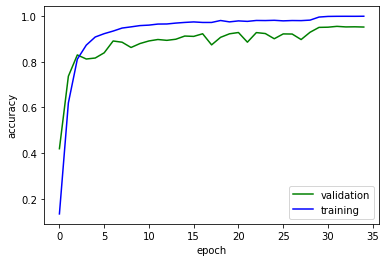

In [ ]:

plt.plot(val_acc_history, 'g', label='validation')
plt.plot(train_acc_history, 'b', label='training')
plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:

PATH = data_path + 'model_34_35.pth'
torch.save(model.state_dict(), PATH)

###Prediction

In [ ]:

model.eval()
labels = []
for inputs in test_loader:
    inputs = transforms.functional.resize(inputs, (112, 112))
    inputs = inputs.to(device)
    outputs = model(inputs)
    
    _n, numbers = torch.max(outputs[:, :10], 1)
    _l, letters = torch.max(outputs[:, 10:], 1)
    preds = torch.zeros(outputs.shape[0], outputs.shape[1], dtype=torch.int)
    index = torch.from_numpy(np.arange(outputs.shape[0]))
    preds[index, numbers] = 1;
    preds[index, letters + 10] = 1;
    
    predictions = preds.to("cpu")
    labels.extend(predictions.numpy())

In [ ]:
import pandas as pd
strings = []
for i in range(len(labels)):
    s = ''
    for j in range(len(labels[i])): 
        if labels[i][j] == 1: s += '1'
        else: s += '0'
    strings.append(s)

print(len(strings))
submission = pd.read_csv(datapath + "sample_submission.csv")
submission['Category'] = strings
submission.to_csv(datapath + 'submission.csv', index=False)

#Autoencoder

###Load Data

In [ ]:
unlabeled_dataset = torch.Tensor(np.clip(np.load(data_path + "images_ul.pkl",allow_pickle=True),0,255)/255.0).unsqueeze(1).to(device)
labeled_dataset  = torch.Tensor(np.clip(np.load(data_path + "images_l.pkl",allow_pickle=True),0,255)/255.0).unsqueeze(1).to(device)


In [ ]:

train_transform = transforms.Compose([
transforms.ToTensor(),
])


test_transform = transforms.Compose([
transforms.ToTensor(),
])

unlabeled_dataset.transform = train_transform
labeled_dataset.transform = test_transform

m=len(unlabeled_dataset)

train_data, val_data = random_split(unlabeled_dataset, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader = torch.utils.data.DataLoader(unlabeled_dataset, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(labeled_dataset, batch_size=batch_size,shuffle=False)

###Model

In [ ]:
class Encoder(nn.Module):
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 32, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
        ### Linear section
        self.encoder_lin = nn.Sequential(
            # nn.Linear(3 * 3 * 32, 128),
            nn.Linear(6 * 6 * 128, 1024),
            nn.ReLU(True),
            # nn.Linear(128, encoded_space_dim)
            nn.Linear(1024, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            # nn.Linear(encoded_space_dim, 128),
            nn.Linear(encoded_space_dim, 1024),
            nn.ReLU(True),
            # nn.Linear(128, 3 * 3 * 32),
            nn.Linear(1024, 6 * 6 * 128),
            nn.ReLU(True)
        )

        # self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(128, 6, 6))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=0, output_padding=0),
            # nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),???
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            # nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
            nn.ConvTranspose2d(32, 1, 3, stride=2, padding=0, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

###Training

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 128

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d,fc2_input_dim=56)
decoder = Decoder(encoded_space_dim=d,fc2_input_dim=56)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, patience=3, verbose=True)

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=1024, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=1024, out_features=4608, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(128, 6, 6))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(32, 1, kernel_size=(3, 3), stride=(2, 2), output_padding=(1, 1))
  )
)

In [ ]:
  def add_noise(inputs,noise_factor=0.3):
     noisy = inputs+torch.randn_like(inputs) * noise_factor
     noisy = torch.clip(noisy,0.,1.)
     return noisy

In [ ]:
### Training function
def train_epoch_den(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_noisy = add_noise(image_batch, noise_factor)
        image_noisy = image_noisy.to(device)    
        # Encode data
        encoded_data = encoder(image_noisy)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        # print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [ ]:
### Testing function
def test_epoch_den(encoder, decoder, device, dataloader, loss_fn,noise_factor=0.3):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch in dataloader:
            # Move tensor to the proper device
            image_noisy = add_noise(image_batch,noise_factor)
            image_noisy = image_noisy.to(device)
            # Encode data
            encoded_data = encoder(image_noisy)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [ ]:
def plot_ae_outputs_den(encoder,decoder,n=5,noise_factor=0.3):
    plt.figure(figsize=(10,4.5))
    for i in range(n):

      ax = plt.subplot(3,n,i+1)
      # img = labeled_dataset[i][0].unsqueeze(0)
      img = labeled_dataset[i].unsqueeze(0)
      image_noisy = add_noise(img,noise_factor)     
      image_noisy = image_noisy.to(device)

      encoder.eval()
      decoder.eval()

      with torch.no_grad():
         rec_img  = decoder(encoder(image_noisy))

      plt.imshow(img.cpu().squeeze().numpy())
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(3, n, i + 1 + n)
      plt.imshow(image_noisy.cpu().squeeze().numpy())
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Corrupted images')

      ax = plt.subplot(3, n, i + 1 + n + n)
      plt.imshow(rec_img.cpu().squeeze().numpy())
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)     
    plt.show()   

EPOCH 1/120

 EPOCH 1/120 	 train loss 0.084759 	 val loss 0.055114


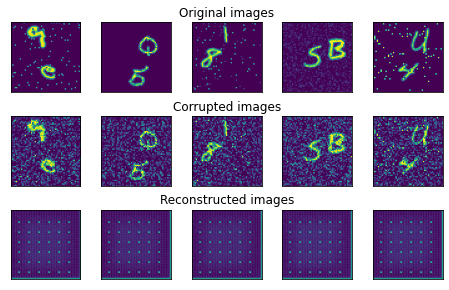

EPOCH 2/120

 EPOCH 2/120 	 train loss 0.052263 	 val loss 0.048183


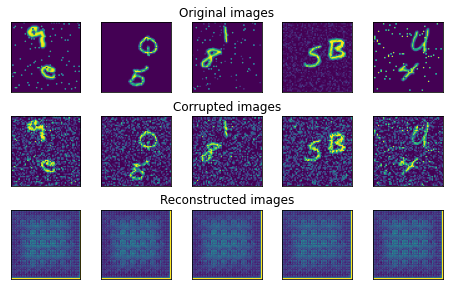

EPOCH 3/120

 EPOCH 3/120 	 train loss 0.036336 	 val loss 0.032885


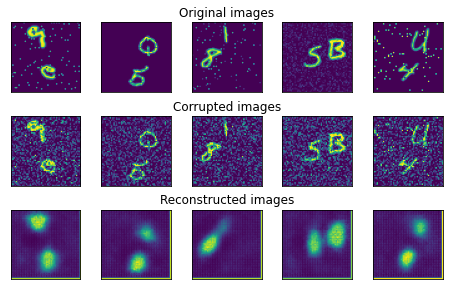

EPOCH 4/120

 EPOCH 4/120 	 train loss 0.031555 	 val loss 0.030665


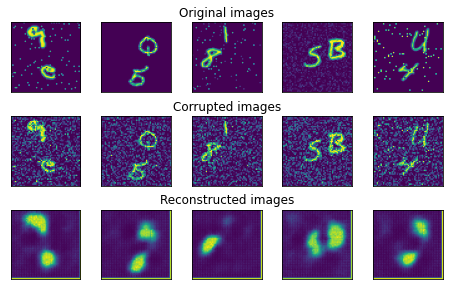

EPOCH 5/120

 EPOCH 5/120 	 train loss 0.029704 	 val loss 0.028908


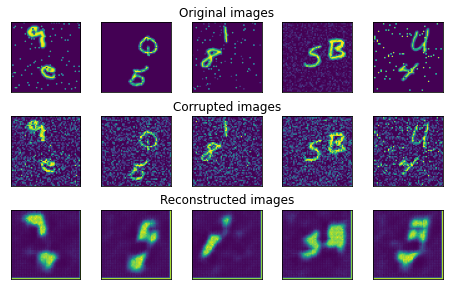

EPOCH 6/120

 EPOCH 6/120 	 train loss 0.027893 	 val loss 0.026912


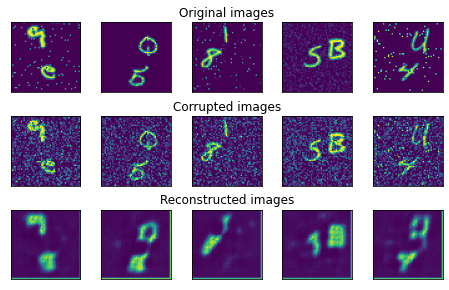

EPOCH 7/120

 EPOCH 7/120 	 train loss 0.026055 	 val loss 0.025094


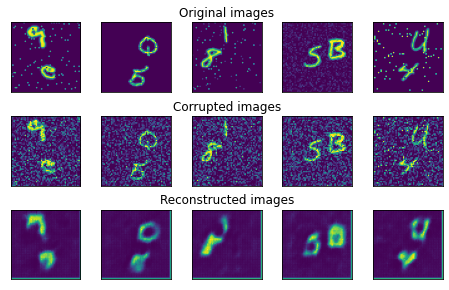

EPOCH 8/120

 EPOCH 8/120 	 train loss 0.024573 	 val loss 0.024124


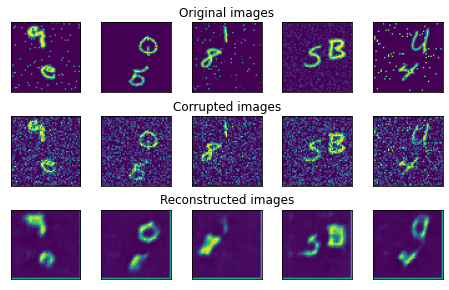

EPOCH 9/120

 EPOCH 9/120 	 train loss 0.023460 	 val loss 0.023026


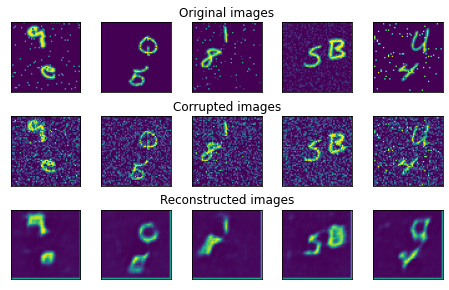

EPOCH 10/120

 EPOCH 10/120 	 train loss 0.022511 	 val loss 0.022042


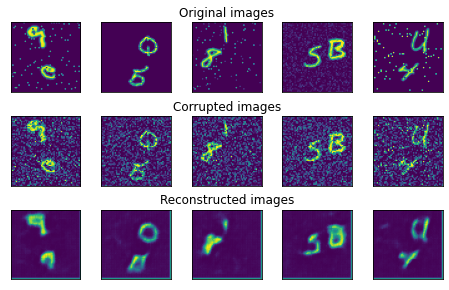

EPOCH 11/120

 EPOCH 11/120 	 train loss 0.021669 	 val loss 0.021268


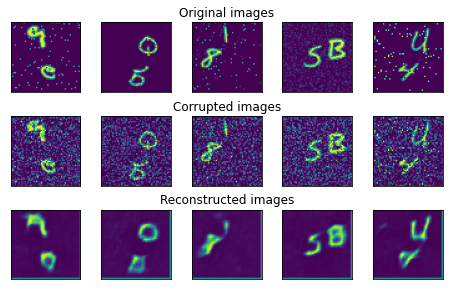

EPOCH 12/120

 EPOCH 12/120 	 train loss 0.020896 	 val loss 0.020565


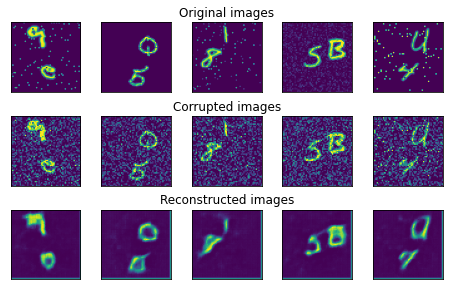

EPOCH 13/120

 EPOCH 13/120 	 train loss 0.020219 	 val loss 0.019930


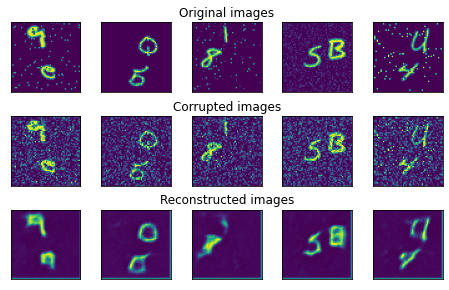

EPOCH 14/120

 EPOCH 14/120 	 train loss 0.019561 	 val loss 0.019311


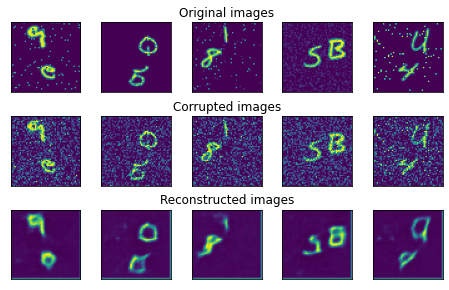

EPOCH 15/120

 EPOCH 15/120 	 train loss 0.018993 	 val loss 0.018692


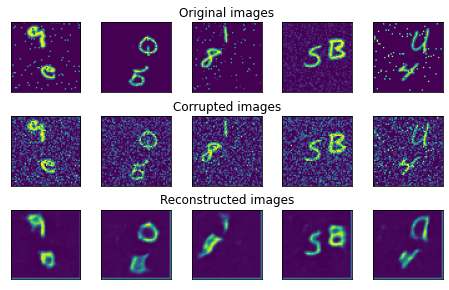

EPOCH 16/120

 EPOCH 16/120 	 train loss 0.018478 	 val loss 0.018141


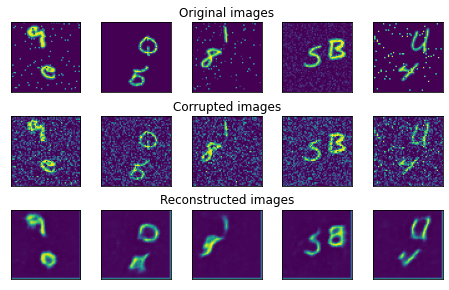

EPOCH 17/120

 EPOCH 17/120 	 train loss 0.017944 	 val loss 0.017664


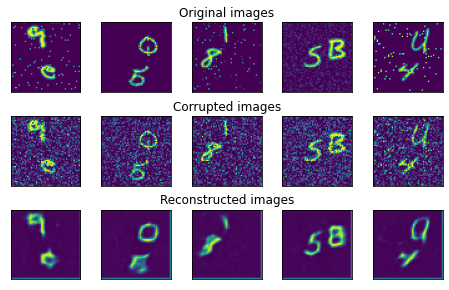

EPOCH 18/120

 EPOCH 18/120 	 train loss 0.017508 	 val loss 0.017326


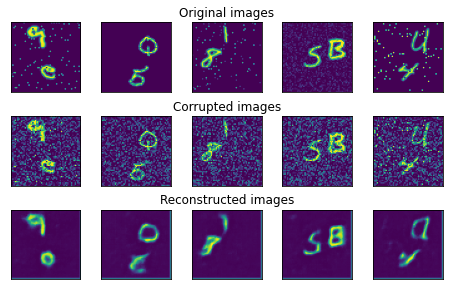

EPOCH 19/120

 EPOCH 19/120 	 train loss 0.017065 	 val loss 0.016844


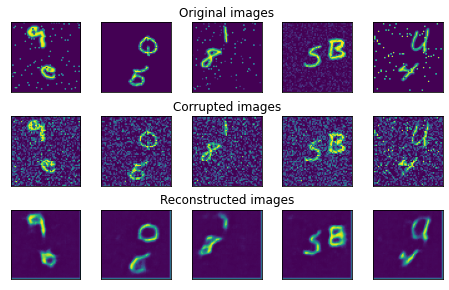

EPOCH 20/120

 EPOCH 20/120 	 train loss 0.016688 	 val loss 0.016475


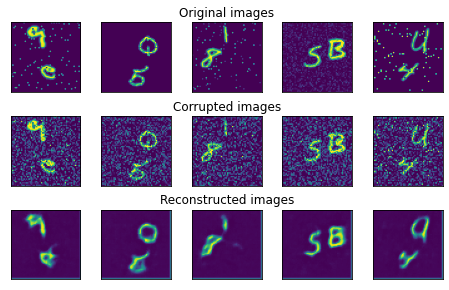

EPOCH 21/120

 EPOCH 21/120 	 train loss 0.016313 	 val loss 0.016161


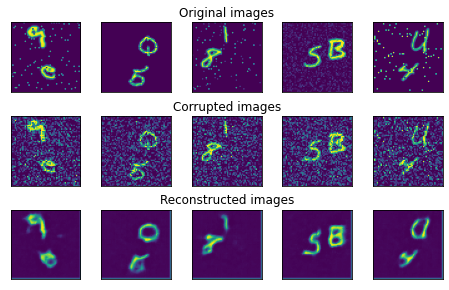

EPOCH 22/120

 EPOCH 22/120 	 train loss 0.015992 	 val loss 0.015767


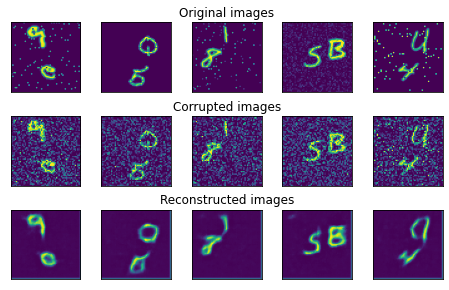

EPOCH 23/120

 EPOCH 23/120 	 train loss 0.015697 	 val loss 0.015514


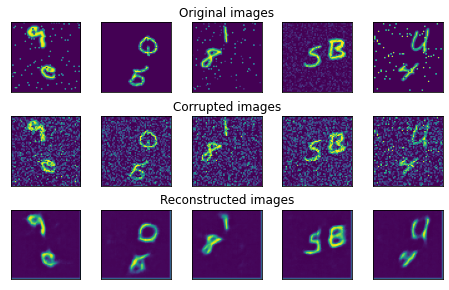

EPOCH 24/120

 EPOCH 24/120 	 train loss 0.015402 	 val loss 0.015287


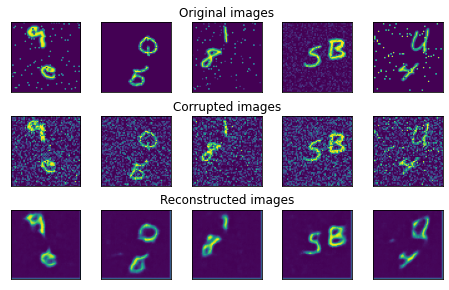

EPOCH 25/120

 EPOCH 25/120 	 train loss 0.015140 	 val loss 0.015196


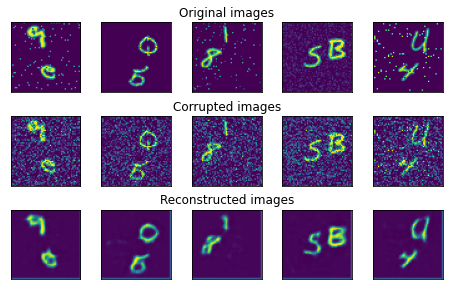

EPOCH 26/120

 EPOCH 26/120 	 train loss 0.014883 	 val loss 0.014722


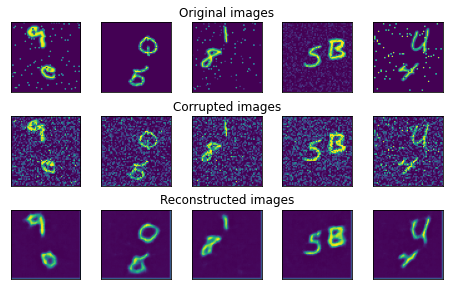

EPOCH 27/120

 EPOCH 27/120 	 train loss 0.014650 	 val loss 0.014482


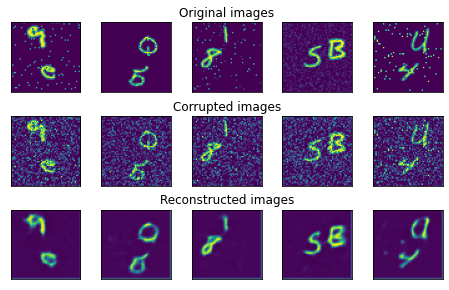

EPOCH 28/120

 EPOCH 28/120 	 train loss 0.014450 	 val loss 0.014558


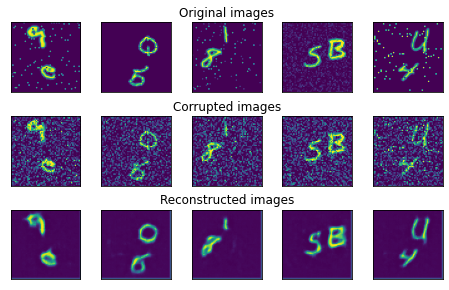

EPOCH 29/120

 EPOCH 29/120 	 train loss 0.014262 	 val loss 0.014167


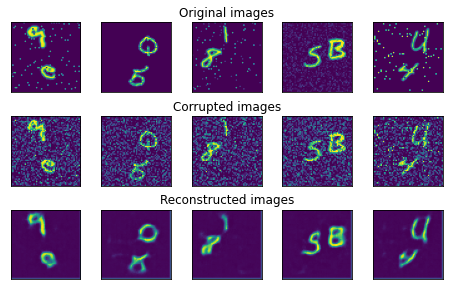

EPOCH 30/120

 EPOCH 30/120 	 train loss 0.014088 	 val loss 0.014016


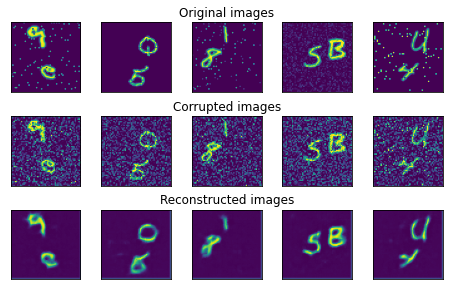

EPOCH 31/120

 EPOCH 31/120 	 train loss 0.013929 	 val loss 0.013874


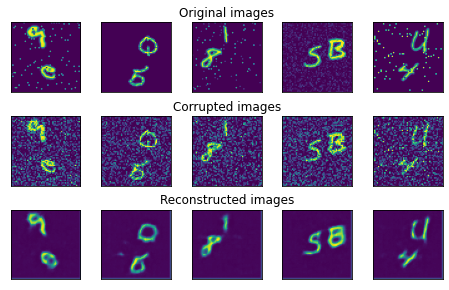

EPOCH 32/120

 EPOCH 32/120 	 train loss 0.013782 	 val loss 0.013641


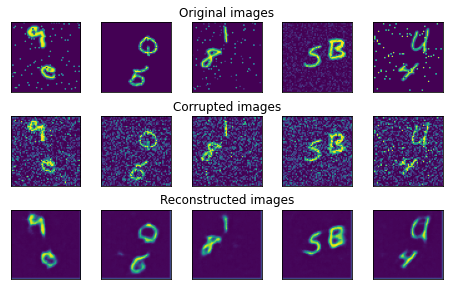

EPOCH 33/120

 EPOCH 33/120 	 train loss 0.013640 	 val loss 0.013604


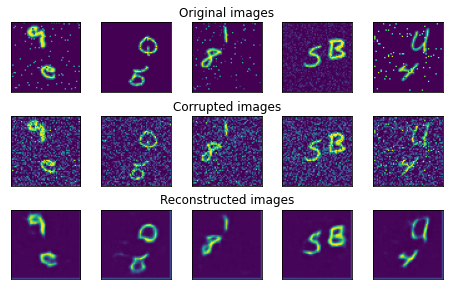

EPOCH 34/120

 EPOCH 34/120 	 train loss 0.013502 	 val loss 0.013461


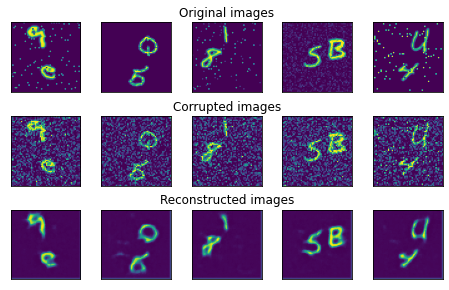

EPOCH 35/120

 EPOCH 35/120 	 train loss 0.013413 	 val loss 0.013339


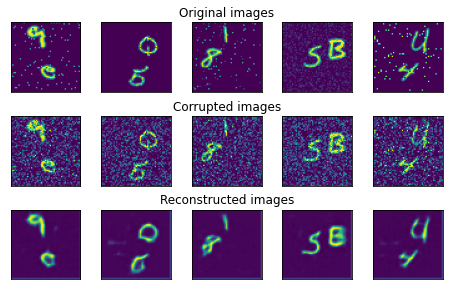

EPOCH 36/120

 EPOCH 36/120 	 train loss 0.013300 	 val loss 0.013365


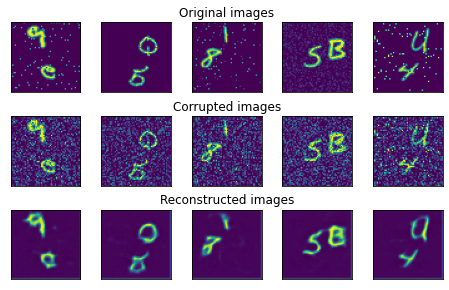

EPOCH 37/120

 EPOCH 37/120 	 train loss 0.013192 	 val loss 0.013161


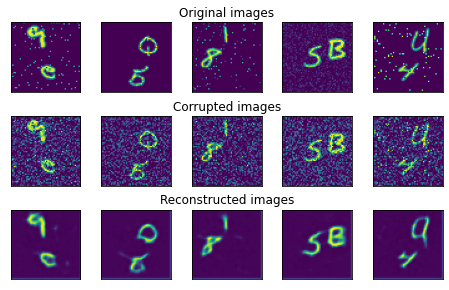

EPOCH 38/120

 EPOCH 38/120 	 train loss 0.013078 	 val loss 0.013040


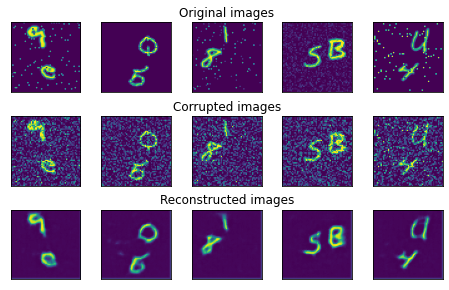

EPOCH 39/120

 EPOCH 39/120 	 train loss 0.013002 	 val loss 0.013062


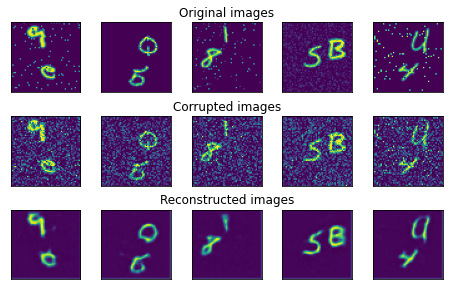

EPOCH 40/120

 EPOCH 40/120 	 train loss 0.012917 	 val loss 0.012806


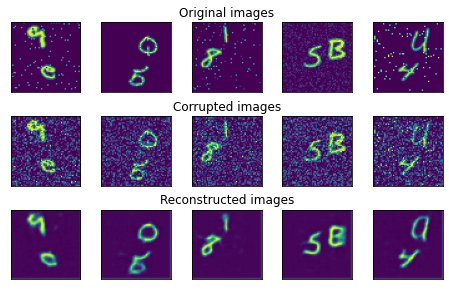

EPOCH 41/120

 EPOCH 41/120 	 train loss 0.012831 	 val loss 0.012833


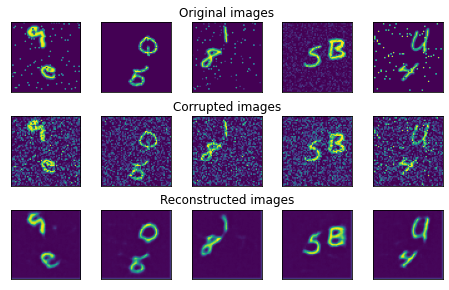

EPOCH 42/120

 EPOCH 42/120 	 train loss 0.012750 	 val loss 0.012697


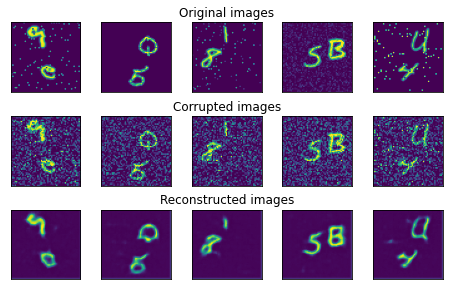

EPOCH 43/120

 EPOCH 43/120 	 train loss 0.012685 	 val loss 0.012743


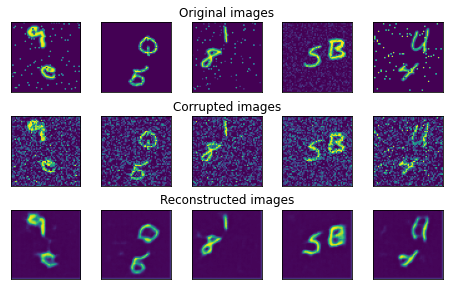

EPOCH 44/120

 EPOCH 44/120 	 train loss 0.012645 	 val loss 0.012583


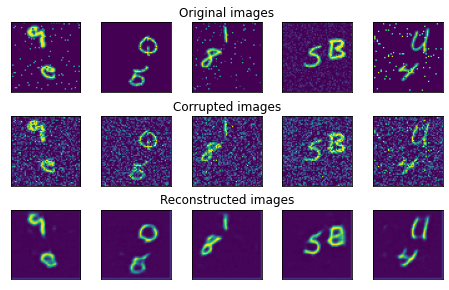

EPOCH 45/120

 EPOCH 45/120 	 train loss 0.012569 	 val loss 0.012433


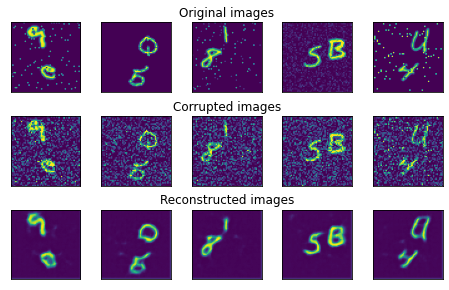

EPOCH 46/120

 EPOCH 46/120 	 train loss 0.012504 	 val loss 0.012503


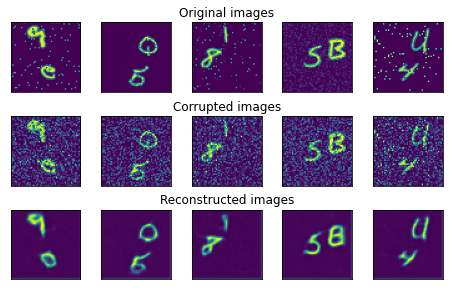

EPOCH 47/120

 EPOCH 47/120 	 train loss 0.012458 	 val loss 0.012410


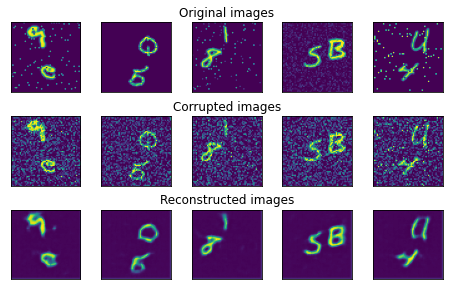

EPOCH 48/120

 EPOCH 48/120 	 train loss 0.012407 	 val loss 0.012413


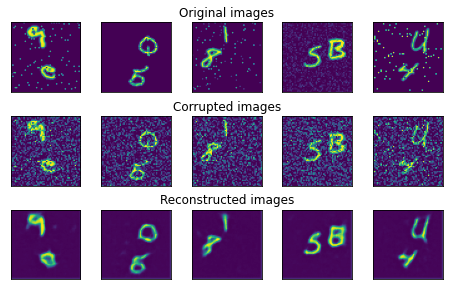

EPOCH 49/120

 EPOCH 49/120 	 train loss 0.012361 	 val loss 0.012393


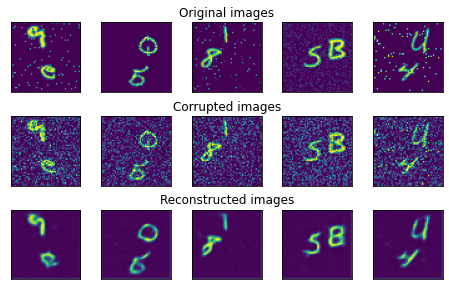

EPOCH 50/120

 EPOCH 50/120 	 train loss 0.012303 	 val loss 0.012301


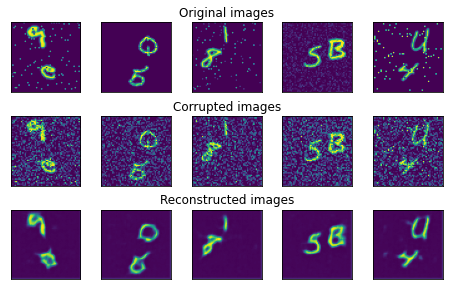

EPOCH 51/120

 EPOCH 51/120 	 train loss 0.012256 	 val loss 0.012224


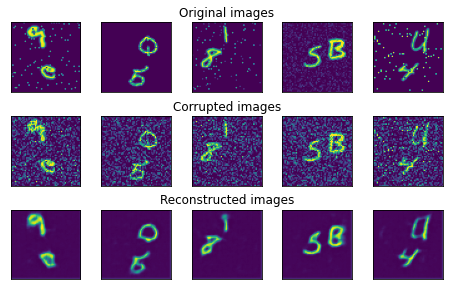

EPOCH 52/120

 EPOCH 52/120 	 train loss 0.012219 	 val loss 0.012265


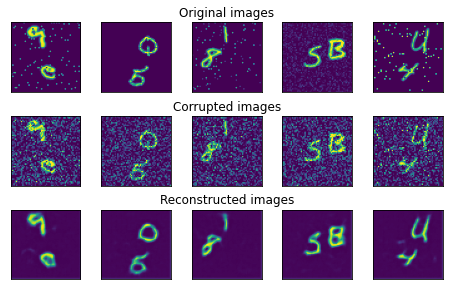

EPOCH 53/120

 EPOCH 53/120 	 train loss 0.012177 	 val loss 0.012208


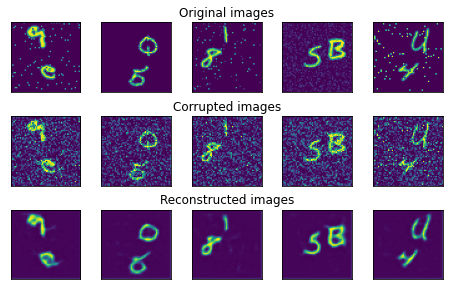

EPOCH 54/120

 EPOCH 54/120 	 train loss 0.012132 	 val loss 0.012193


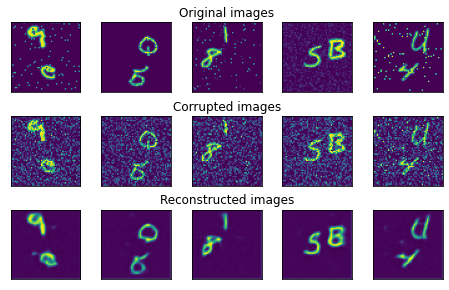

EPOCH 55/120

 EPOCH 55/120 	 train loss 0.012131 	 val loss 0.012149


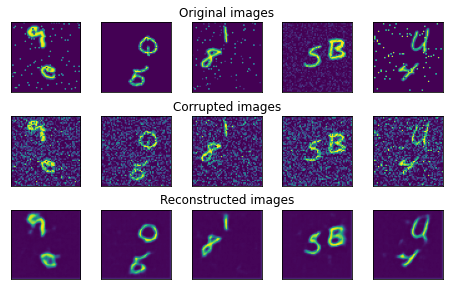

EPOCH 56/120

 EPOCH 56/120 	 train loss 0.012104 	 val loss 0.012227


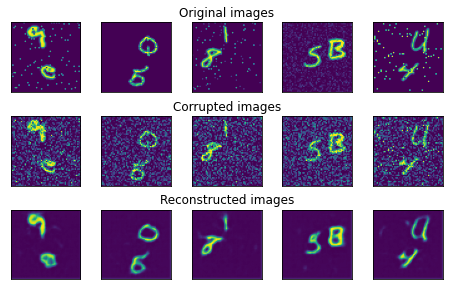

EPOCH 57/120

 EPOCH 57/120 	 train loss 0.012048 	 val loss 0.011986


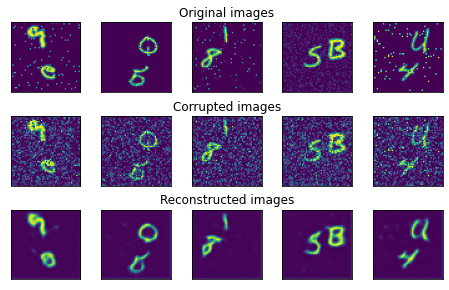

EPOCH 58/120

 EPOCH 58/120 	 train loss 0.012008 	 val loss 0.012122


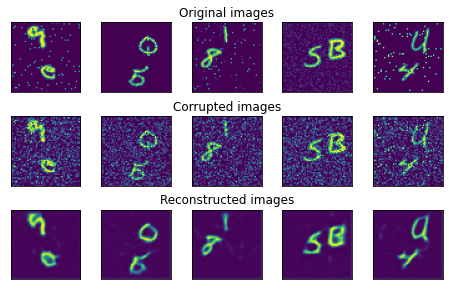

EPOCH 59/120

 EPOCH 59/120 	 train loss 0.011997 	 val loss 0.012039


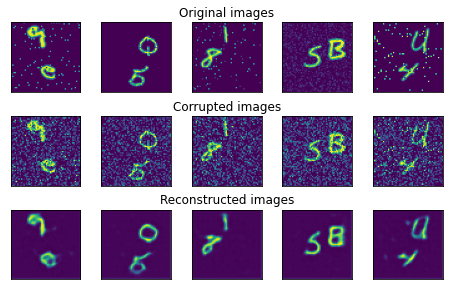

EPOCH 60/120

 EPOCH 60/120 	 train loss 0.011964 	 val loss 0.012068


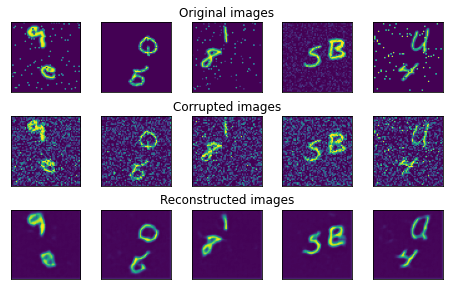

EPOCH 61/120
Epoch    61: reducing learning rate of group 0 to 1.0000e-04.
Epoch    61: reducing learning rate of group 1 to 1.0000e-04.

 EPOCH 61/120 	 train loss 0.011958 	 val loss 0.012624


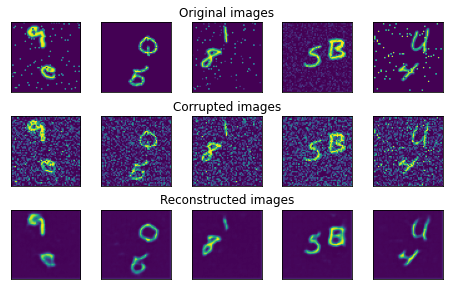

EPOCH 62/120

 EPOCH 62/120 	 train loss 0.011313 	 val loss 0.011011


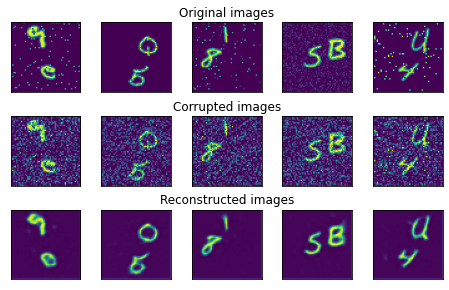

EPOCH 63/120

 EPOCH 63/120 	 train loss 0.011120 	 val loss 0.010942


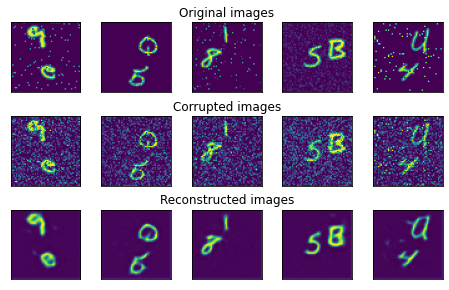

EPOCH 64/120

 EPOCH 64/120 	 train loss 0.011068 	 val loss 0.010915


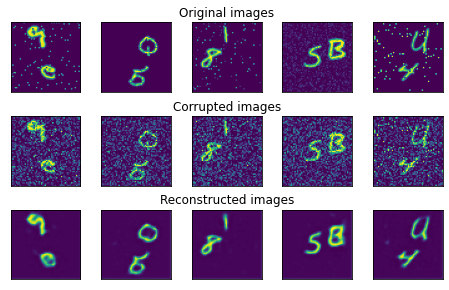

EPOCH 65/120

 EPOCH 65/120 	 train loss 0.011041 	 val loss 0.010884


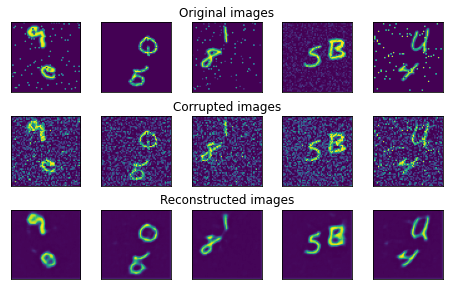

EPOCH 66/120

 EPOCH 66/120 	 train loss 0.011015 	 val loss 0.010866


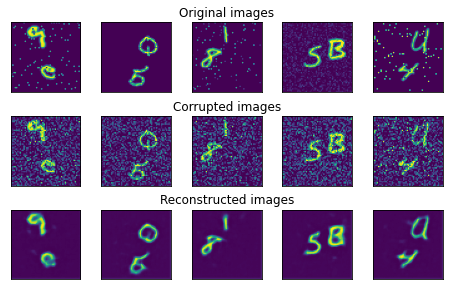

EPOCH 67/120

 EPOCH 67/120 	 train loss 0.010995 	 val loss 0.010839


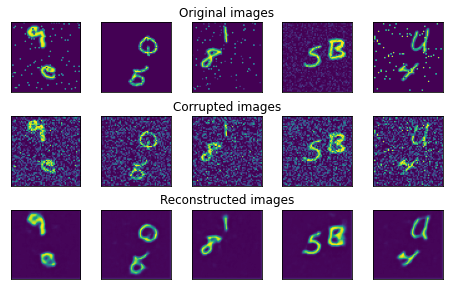

EPOCH 68/120

 EPOCH 68/120 	 train loss 0.010978 	 val loss 0.010835


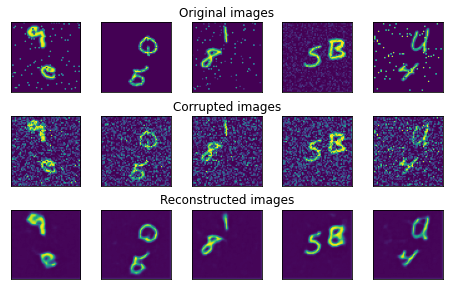

EPOCH 69/120

 EPOCH 69/120 	 train loss 0.010963 	 val loss 0.010814


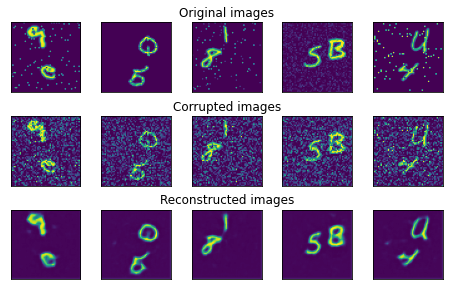

EPOCH 70/120

 EPOCH 70/120 	 train loss 0.010949 	 val loss 0.010814


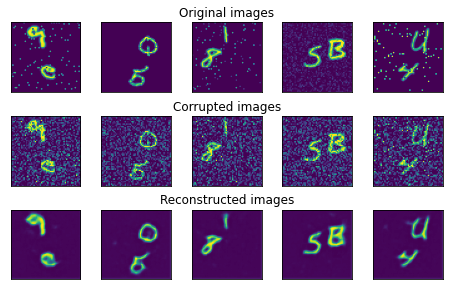

EPOCH 71/120

 EPOCH 71/120 	 train loss 0.010937 	 val loss 0.010802


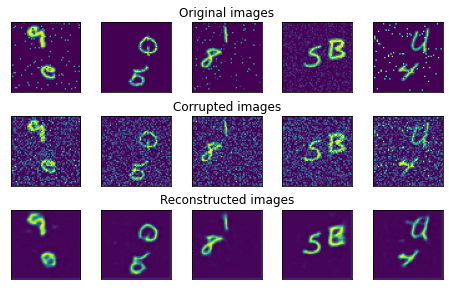

EPOCH 72/120

 EPOCH 72/120 	 train loss 0.010927 	 val loss 0.010786


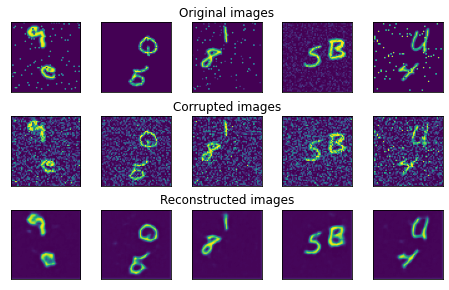

EPOCH 73/120

 EPOCH 73/120 	 train loss 0.010919 	 val loss 0.010784


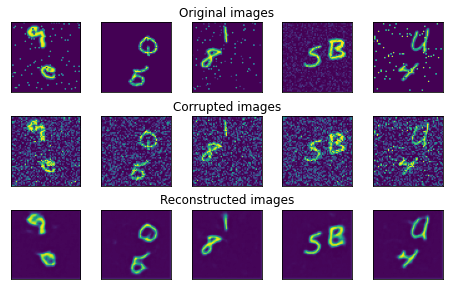

EPOCH 74/120

 EPOCH 74/120 	 train loss 0.010907 	 val loss 0.010767


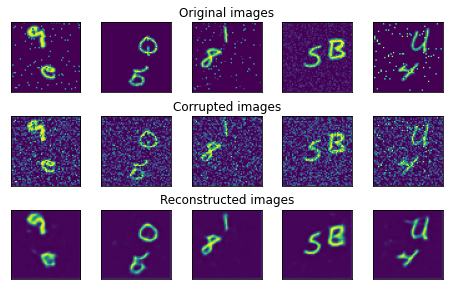

EPOCH 75/120

 EPOCH 75/120 	 train loss 0.010896 	 val loss 0.010753


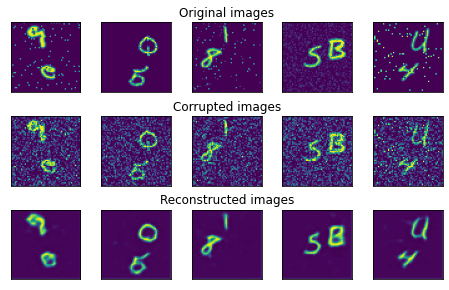

EPOCH 76/120

 EPOCH 76/120 	 train loss 0.010889 	 val loss 0.010749


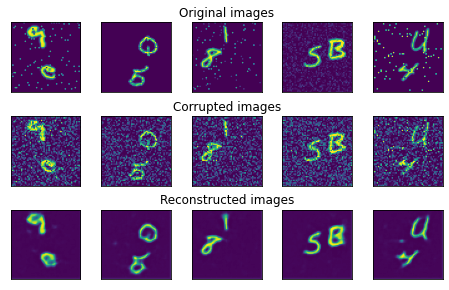

EPOCH 77/120

 EPOCH 77/120 	 train loss 0.010880 	 val loss 0.010756


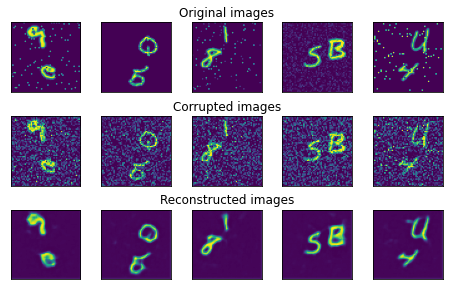

EPOCH 78/120

 EPOCH 78/120 	 train loss 0.010868 	 val loss 0.010726


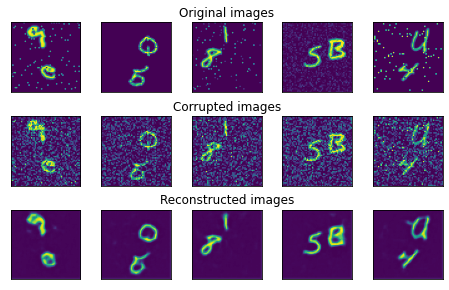

EPOCH 79/120

 EPOCH 79/120 	 train loss 0.010857 	 val loss 0.010722


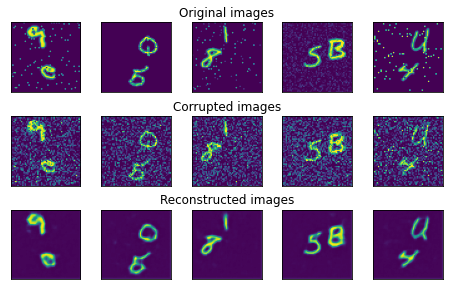

EPOCH 80/120

 EPOCH 80/120 	 train loss 0.010849 	 val loss 0.010707


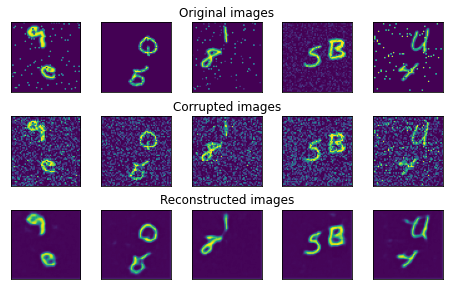

EPOCH 81/120

 EPOCH 81/120 	 train loss 0.010841 	 val loss 0.010718


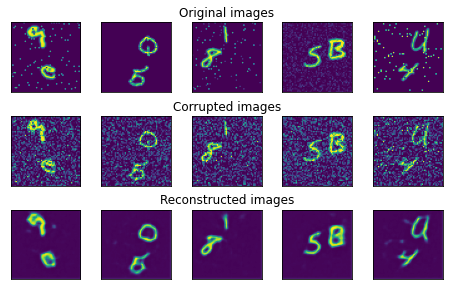

EPOCH 82/120

 EPOCH 82/120 	 train loss 0.010834 	 val loss 0.010699


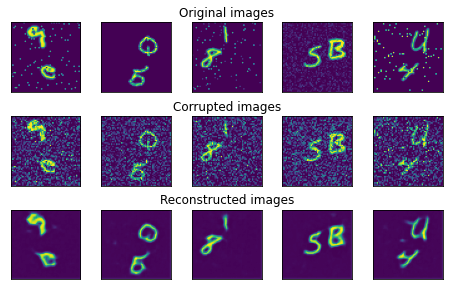

EPOCH 83/120

 EPOCH 83/120 	 train loss 0.010825 	 val loss 0.010705


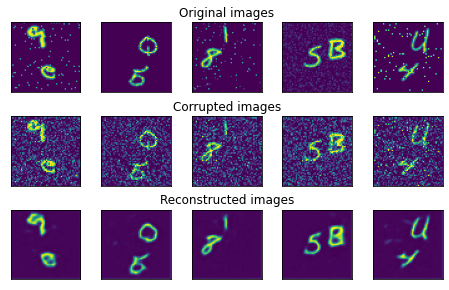

EPOCH 84/120

 EPOCH 84/120 	 train loss 0.010815 	 val loss 0.010728


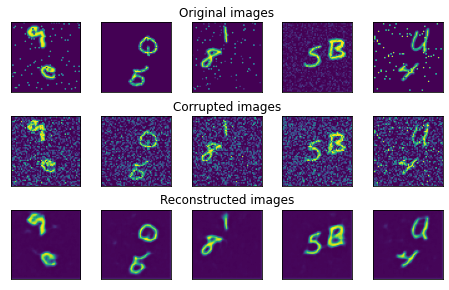

EPOCH 85/120

 EPOCH 85/120 	 train loss 0.010807 	 val loss 0.010681


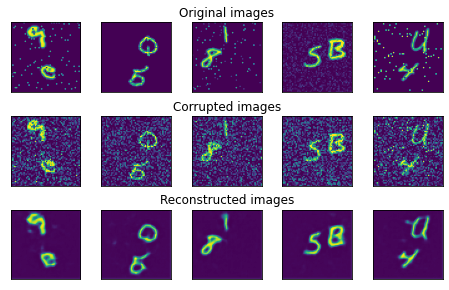

EPOCH 86/120

 EPOCH 86/120 	 train loss 0.010804 	 val loss 0.010669


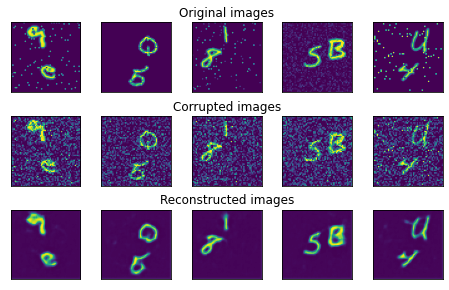

EPOCH 87/120

 EPOCH 87/120 	 train loss 0.010790 	 val loss 0.010687


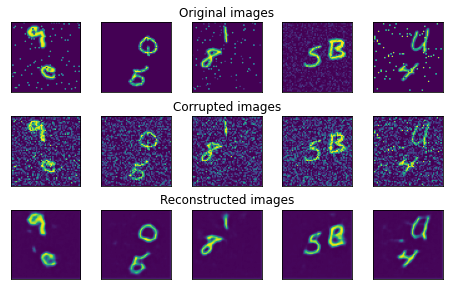

EPOCH 88/120

 EPOCH 88/120 	 train loss 0.010783 	 val loss 0.010678


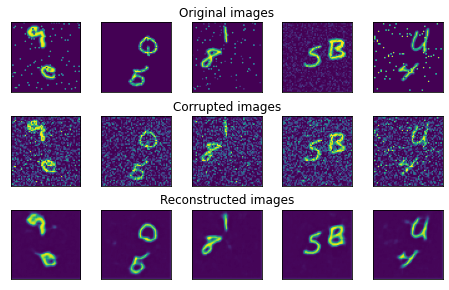

EPOCH 89/120

 EPOCH 89/120 	 train loss 0.010775 	 val loss 0.010674


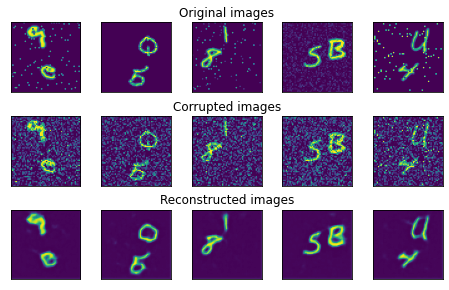

EPOCH 90/120

 EPOCH 90/120 	 train loss 0.010765 	 val loss 0.010647


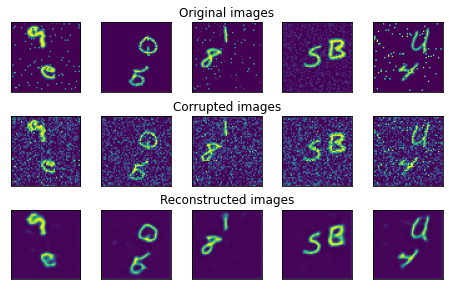

EPOCH 91/120

 EPOCH 91/120 	 train loss 0.010762 	 val loss 0.010727


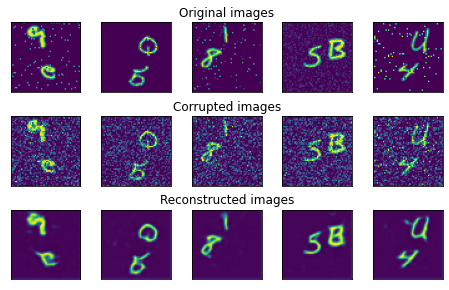

EPOCH 92/120

 EPOCH 92/120 	 train loss 0.010747 	 val loss 0.010634


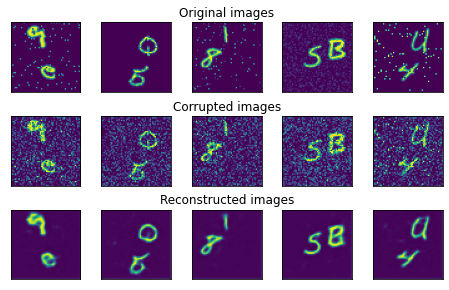

EPOCH 93/120

 EPOCH 93/120 	 train loss 0.010746 	 val loss 0.010642


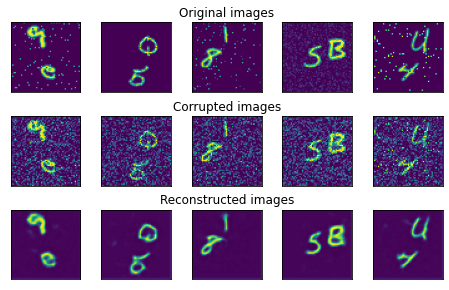

EPOCH 94/120

 EPOCH 94/120 	 train loss 0.010743 	 val loss 0.010681


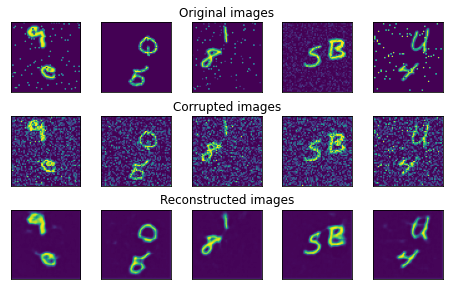

EPOCH 95/120

 EPOCH 95/120 	 train loss 0.010731 	 val loss 0.010641


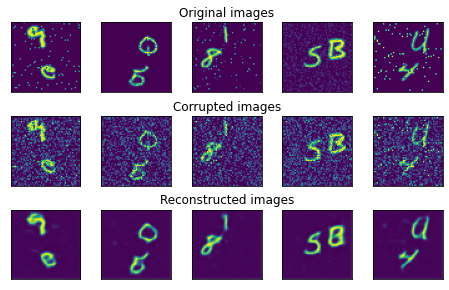

EPOCH 96/120

 EPOCH 96/120 	 train loss 0.010726 	 val loss 0.010632


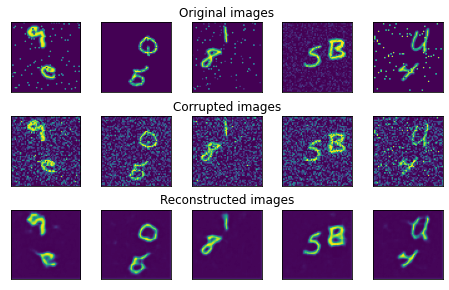

EPOCH 97/120

 EPOCH 97/120 	 train loss 0.010719 	 val loss 0.010605


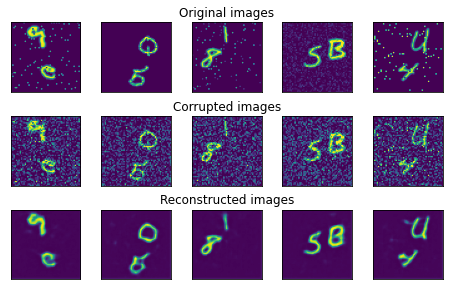

EPOCH 98/120

 EPOCH 98/120 	 train loss 0.010711 	 val loss 0.010607


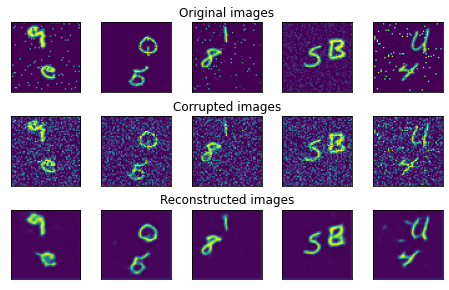

EPOCH 99/120

 EPOCH 99/120 	 train loss 0.010708 	 val loss 0.010596


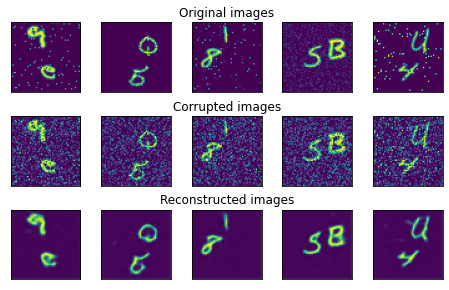

EPOCH 100/120

 EPOCH 100/120 	 train loss 0.010698 	 val loss 0.010588


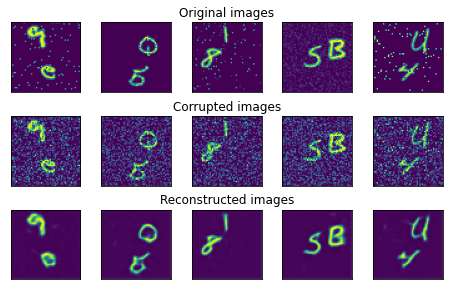

EPOCH 101/120

 EPOCH 101/120 	 train loss 0.010693 	 val loss 0.010591


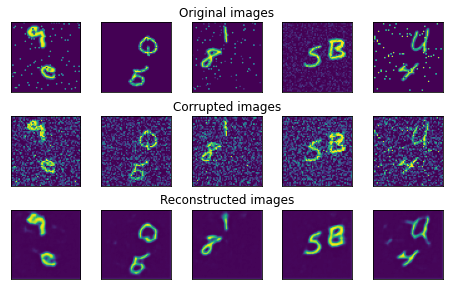

EPOCH 102/120

 EPOCH 102/120 	 train loss 0.010687 	 val loss 0.010605


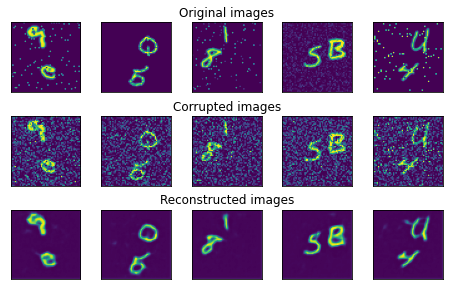

EPOCH 103/120

 EPOCH 103/120 	 train loss 0.010676 	 val loss 0.010685


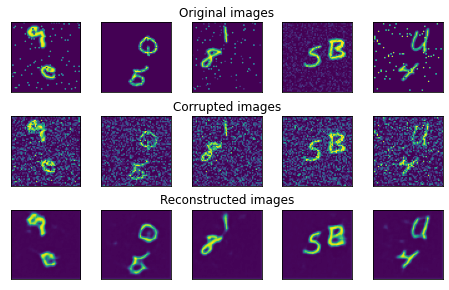

EPOCH 104/120

 EPOCH 104/120 	 train loss 0.010677 	 val loss 0.010561


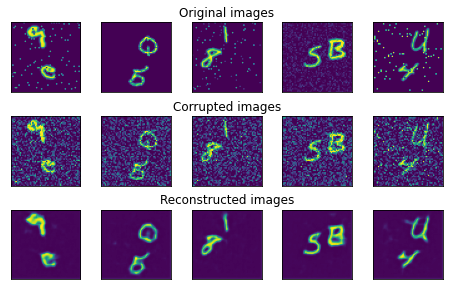

EPOCH 105/120

 EPOCH 105/120 	 train loss 0.010668 	 val loss 0.010626


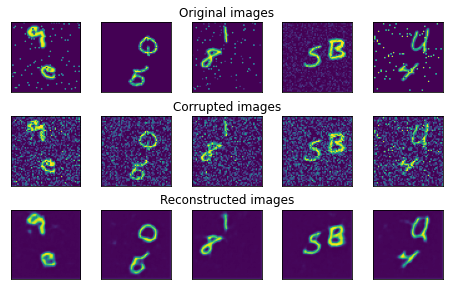

EPOCH 106/120

 EPOCH 106/120 	 train loss 0.010665 	 val loss 0.010569


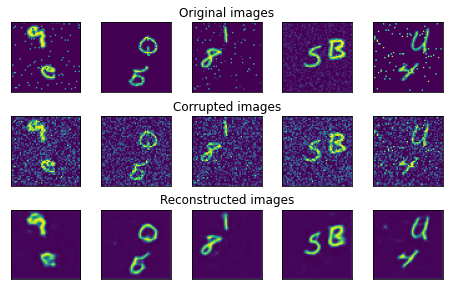

EPOCH 107/120

 EPOCH 107/120 	 train loss 0.010659 	 val loss 0.010538


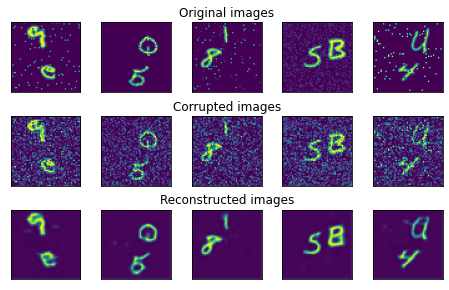

EPOCH 108/120

 EPOCH 108/120 	 train loss 0.010652 	 val loss 0.010624


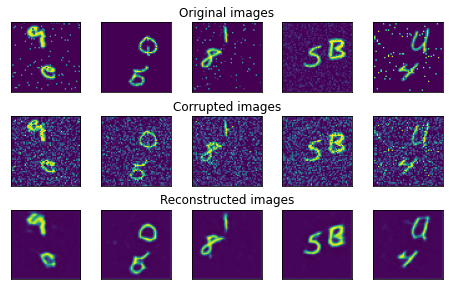

EPOCH 109/120

 EPOCH 109/120 	 train loss 0.010644 	 val loss 0.010552


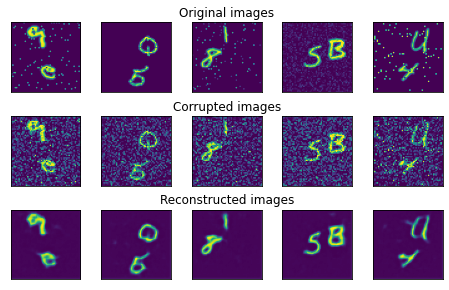

EPOCH 110/120

 EPOCH 110/120 	 train loss 0.010642 	 val loss 0.010566


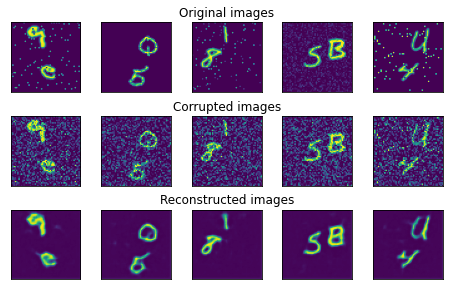

EPOCH 111/120
Epoch   111: reducing learning rate of group 0 to 1.0000e-05.
Epoch   111: reducing learning rate of group 1 to 1.0000e-05.

 EPOCH 111/120 	 train loss 0.010637 	 val loss 0.010682


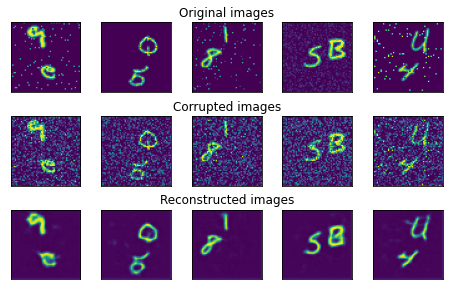

EPOCH 112/120

 EPOCH 112/120 	 train loss 0.010533 	 val loss 0.010389


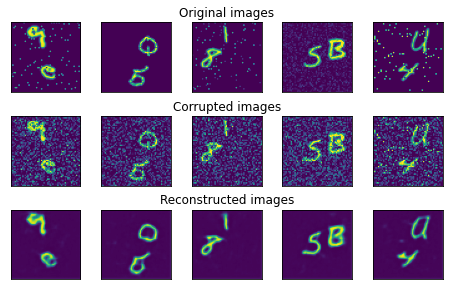

EPOCH 113/120

 EPOCH 113/120 	 train loss 0.010503 	 val loss 0.010377


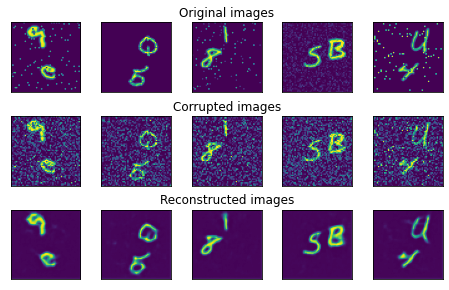

EPOCH 114/120

 EPOCH 114/120 	 train loss 0.010496 	 val loss 0.010368


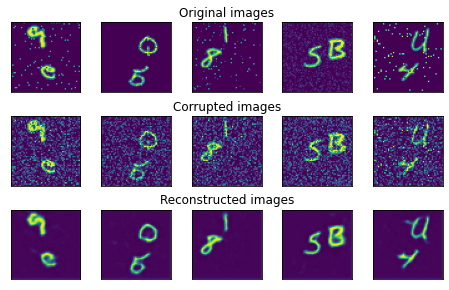

EPOCH 115/120

 EPOCH 115/120 	 train loss 0.010490 	 val loss 0.010370


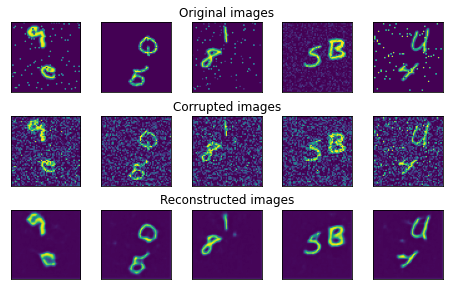

EPOCH 116/120

 EPOCH 116/120 	 train loss 0.010488 	 val loss 0.010357


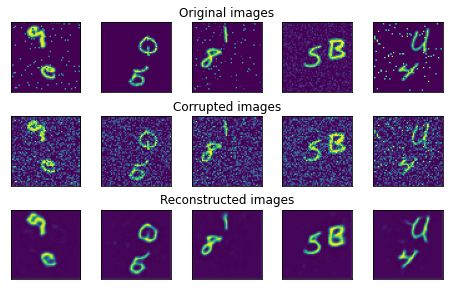

EPOCH 117/120

 EPOCH 117/120 	 train loss 0.010485 	 val loss 0.010355


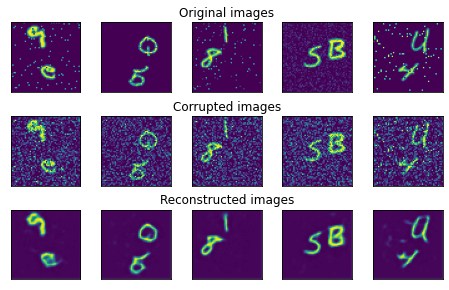

EPOCH 118/120

 EPOCH 118/120 	 train loss 0.010484 	 val loss 0.010353


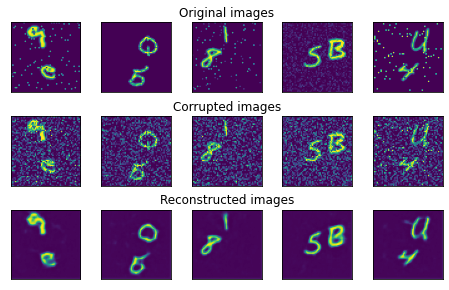

EPOCH 119/120

 EPOCH 119/120 	 train loss 0.010482 	 val loss 0.010353


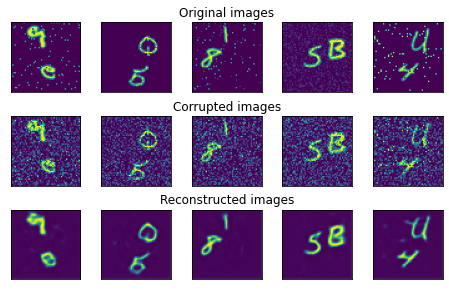

EPOCH 120/120

 EPOCH 120/120 	 train loss 0.010478 	 val loss 0.010350


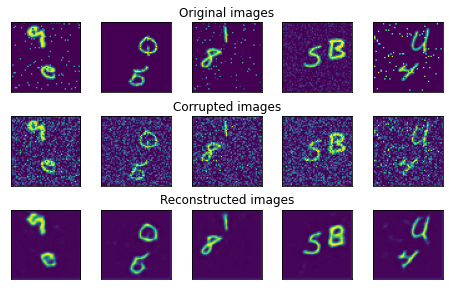

In [ ]:
### Training cycle
noise_factor = 0.25
num_epochs = 120
history_da={'train_loss':[],'val_loss':[]}

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss=train_epoch_den(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_loader, 
        loss_fn=loss_fn, 
        optimizer=optim, 
        noise_factor=noise_factor)
    ### Validation  (use the testing function)
    val_loss = test_epoch_den(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=valid_loader, 
        loss_fn=loss_fn,
        noise_factor=noise_factor)
    lr_scheduler.step(val_loss)
    # Print Validationloss
    history_da['train_loss'].append(train_loss)
    history_da['val_loss'].append(val_loss)
    print('\n EPOCH {}/{} \t train loss {:.6f} \t val loss {:.6f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    plot_ae_outputs_den(encoder,decoder,noise_factor=noise_factor)

In [ ]:

torch.save(encoder.state_dict(), data_path + 'encoder.pth')
torch.save(decoder.state_dict(), data_path + 'decoder.pth')

###Denoise labeled images

In [ ]:
n = labeled_dataset.shape[0]
imgs = []
for i in range(n):
      img = labeled_dataset[i].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      labeled_dataset[i] = rec_img;
      # print(rec_img.squeeze().shape)
      # imgs.append(rec_img.cpu());



In [ ]:
denoised = labeled_dataset.cpu().numpy().squeeze()

In [ ]:
print(denoised.shape)
with open(data_path + 'denoised_images_by_autoencoder.npy', 'wb') as f:
    np.save(f, denoised)
f.close()

#Bagging

In [ ]:
import pandas as pd
def predict(model, bagging_index):
    model.eval()
    labels = []
    for inputs in test_loader:
        inputs = transforms.functional.resize(inputs, (112, 112))
        inputs = inputs.to(device)
        outputs = model(inputs)
    
        _n, numbers = torch.max(outputs[:, :10], 1)
        _l, letters = torch.max(outputs[:, 10:], 1)
        preds = torch.zeros(outputs.shape[0], outputs.shape[1], dtype=torch.int)
        index = torch.from_numpy(np.arange(outputs.shape[0]))
        preds[index, numbers] = 1;
        preds[index, letters + 10] = 1;
    
        predictions = preds.to("cpu")
        labels.extend(predictions.numpy())
        # print(len(labels) / len(test_loader.dataset))

    strings = []
    for i in range(len(labels)):
        s = ''
        for j in range(len(labels[i])): 
            if labels[i][j] == 1: s += '1'
            else: s += '0'
        strings.append(s)
    print(len(strings))
    submission = pd.read_csv(data_path + "sample_submission.csv")
    submission['Category'] = strings
    submission.to_csv(data_path + 'bagging/output' + str(bagging_index) + '.csv', index=False)

In [ ]:
epochs = 15
for i in range(1, 3):
    model = ResNet34(1, 36).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, verbose=True)
    
    train_size = int(0.7 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    model, _ = train_model(model, {"train": train_loader, "val": val_loader}, criterion, optimizer, epochs)
    predict(model, i)


Epoch 0/14
----------
train Loss: 0.1780 Acc: 0.0897
val Loss: 0.1182 Acc: 0.2949

Epoch 1/14
----------
train Loss: 0.0780 Acc: 0.5663
val Loss: 0.0608 Acc: 0.6911

Epoch 2/14
----------
train Loss: 0.0417 Acc: 0.8087
val Loss: 0.0407 Acc: 0.8011

Epoch 3/14
----------
train Loss: 0.0263 Acc: 0.8925
val Loss: 0.0369 Acc: 0.8211

Epoch 4/14
----------
train Loss: 0.0184 Acc: 0.9352
val Loss: 0.0295 Acc: 0.8594

Epoch 5/14
----------
train Loss: 0.0147 Acc: 0.9503
val Loss: 0.0410 Acc: 0.8087

Epoch 6/14
----------
train Loss: 0.0118 Acc: 0.9622
val Loss: 0.0274 Acc: 0.8697

Epoch 7/14
----------
train Loss: 0.0098 Acc: 0.9716
val Loss: 0.0313 Acc: 0.8576

Epoch 8/14
----------
train Loss: 0.0097 Acc: 0.9707
val Loss: 0.0259 Acc: 0.8784

Epoch 9/14
----------
train Loss: 0.0080 Acc: 0.9789
val Loss: 0.0262 Acc: 0.8818

Epoch 10/14
----------
train Loss: 0.0079 Acc: 0.9777
val Loss: 0.0321 Acc: 0.8560

Epoch 11/14
----------
train Loss: 0.0080 Acc: 0.9761
val Loss: 0.0236 Acc: 0.8950

Ep

In [ ]:
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

In [ ]:
files = []

for fn in os.listdir(data_path + 'bagging'):
    if ".csv" in fn:
      files += [open(data_path + 'bagging/'+fn,'r')]

In [ ]:
for f in files:
    f.readline()

preds = []
countTieL = 0
countTieN = 0

for i in range(15000):
    dictN = {}
    dictL = {}
    for f in files:
        s = f.readline().strip().split(',')[1]
        number = s[:10]
        if(number in dictN.keys()):
            dictN[number] += 1
        else:
            dictN[number] = 1

        letter = s[10:]
        if(letter in dictL.keys()):
            dictL[letter] += 1
        else:
            dictL[letter] = 1

    maxN = max(dictN.items(), key=lambda x : x[1])[0]
    maxL = max(dictL.items(), key=lambda x : x[1])[0]

    maxNv = max(dictN.items(), key=lambda x : x[1])[1]
    maxLv = max(dictL.items(), key=lambda x : x[1])[1]

    tieN = 0
    tieL = 0
    for k,v in dictN.items():
        if(v == maxNv):
            tieN += 1
    for k,v in dictL.items():
        if(v == maxLv):
            tieL += 1  
    if(tieN > 1):
        countTieN += 1
    if(tieL > 1):
        countTieL += 1   
    preds += [maxN+maxL]

print(countTieL)
print(countTieN)

137
77


In [ ]:
for f in files:
    f.close()

In [ ]:
with open(data_path + "predictions.csv", "w") as f:
    f.write("# Id,Category\n")
    for i, r in tqdm(enumerate(preds)):
        f.write(str(i)+",")
        f.write(r)
        if(i != len(preds)-1):
            f.write("\n")

15000it [00:00, 604093.83it/s]
